# pre process dataset
the data we get is in the form of video, we need to extract the frames from the video and save them as images.

## Config
Set the input video path and output image path, as well as the output image size.

In [1]:
# Set the video directory and output directory
video_dir = './raw_data'
data_dir = './data'

#the output image size
output_size = (256, 256)

## peek at current raw data

In [13]:
from pathlib import Path
import cv2
import pandas as pd

video_dir = Path(video_dir)

data = []

for class_dir in video_dir.glob('*/'):
    for video_path in list(class_dir.glob('*.MOV')) + list(class_dir.glob('*.mp4')):
        cap = cv2.VideoCapture(str(video_path))

        num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

        data.append({
            'class': class_dir.name,
            'video': video_path.name,
            'frames': num_frames,
            'width': width,
            'height': height
        })

        cap.release()

df = pd.DataFrame(data)
df.groupby('class')['frames'].sum().reset_index(name='total_frames')

,class,total_frames
0,不破不立,756
1,你只能愛我,1010
2,嘉義遊園地,1050
3,圖騰與禁忌,1158
4,地球何許之三,1167
5,城市失格-西門町夜晚,1140
6,城市失格-西門町白日,1276
7,夜生活,1528
8,大事件景觀之4,869
9,大地的風不再吹,833


## extract frames from video

In [1]:
import cv2
import os
from pathlib import Path
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor
import imutils

def get_total_frames(video_files):
    total_frames = 0
    for video_path in video_files:
        cap = cv2.VideoCapture(str(video_path))
        total_frames += int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        cap.release()
    return total_frames

def resize_frame(frame, output_size):
    return imutils.resize(frame, width=output_size[0], height=output_size[1])

def process_video(class_name, video_path, pbar):
    class_dir = Path(data_dir) / class_name
    class_dir.mkdir(parents=True, exist_ok=True)

    cap = cv2.VideoCapture(str(video_path))

    output_num = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame = resize_frame(frame, output_size)

        output_path = os.path.join(class_dir, f'{output_num:06d}.jpg')
        cv2.imwrite(output_path, frame)
        output_num += 1
        pbar.update(1)

    cap.release()

class_folders = [class_folder for class_folder in os.listdir(video_dir) if os.path.isdir(os.path.join(video_dir, class_folder))]

video_files = [(class_folder, os.path.join(video_dir, class_folder, filename))
               for class_folder in class_folders
               for filename in os.listdir(os.path.join(video_dir, class_folder))
               if filename.endswith('.MOV') or filename.endswith('.mp4')]

total_frames = get_total_frames([video_path for _, video_path in video_files])

with tqdm(total=total_frames, desc='Processing videos') as pbar:
    with ThreadPoolExecutor() as executor:
        for class_name, video_path in video_files:
            executor.submit(process_video, class_name, video_path, pbar)


NameError: name 'video_dir' is not defined

## Show the output images

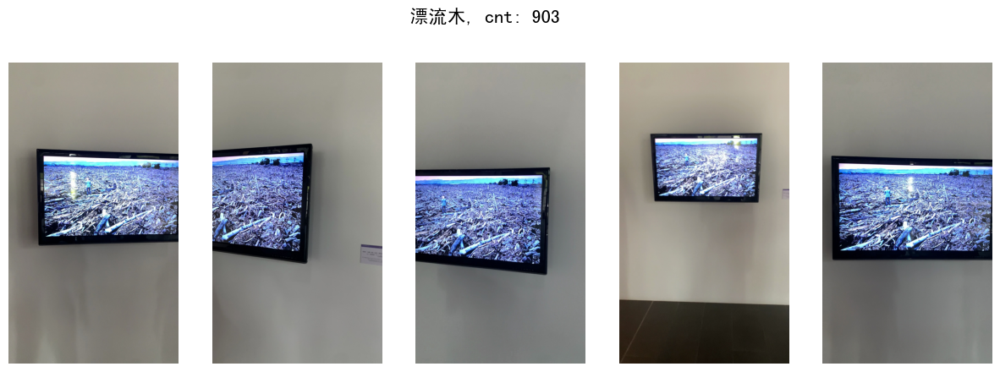

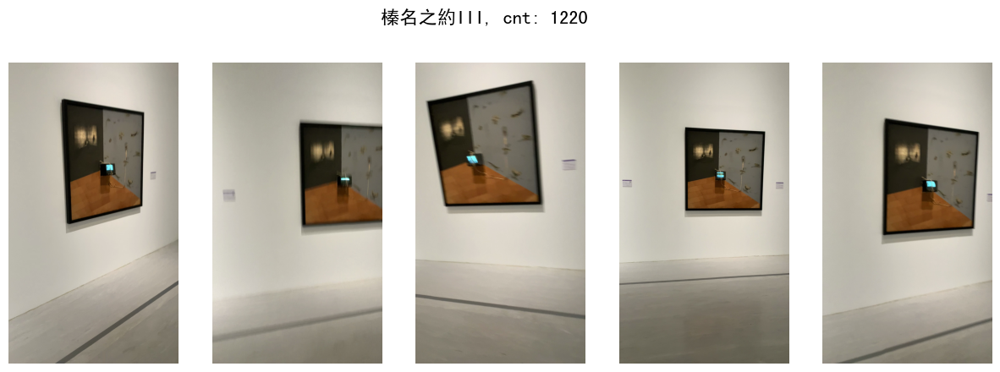

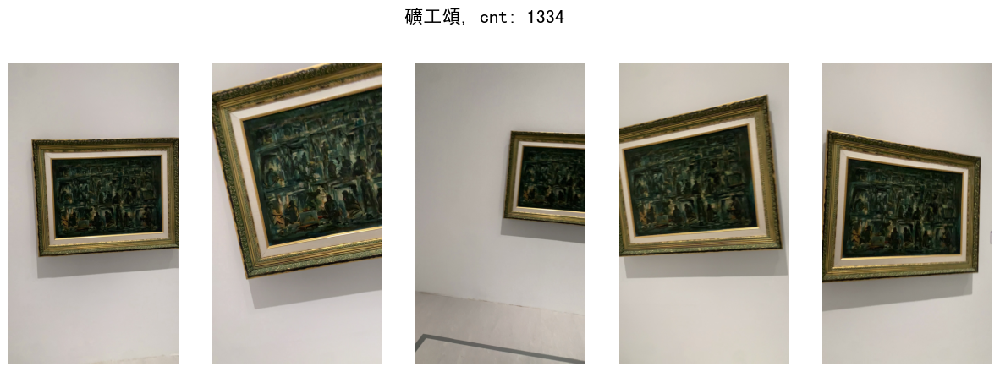

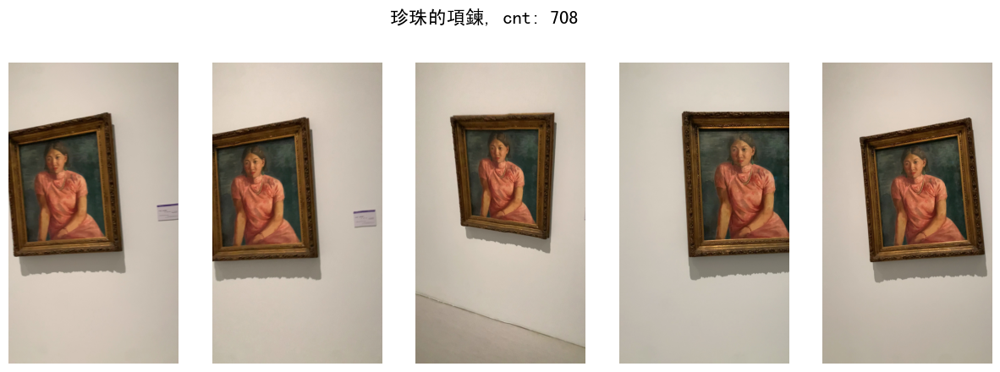

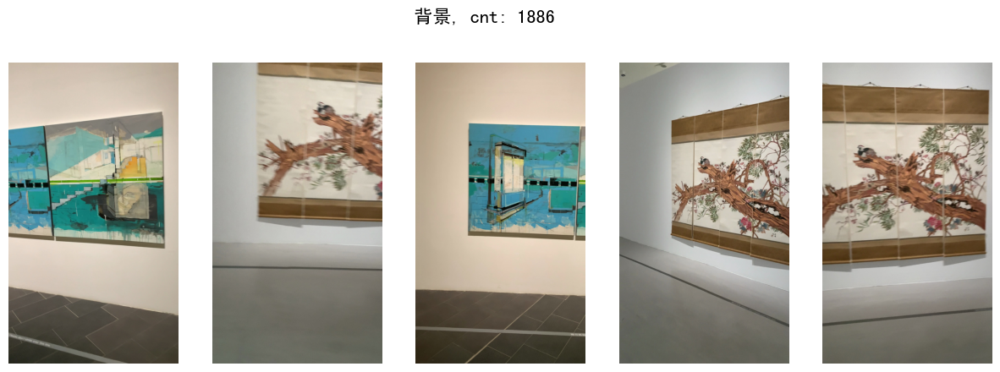

...

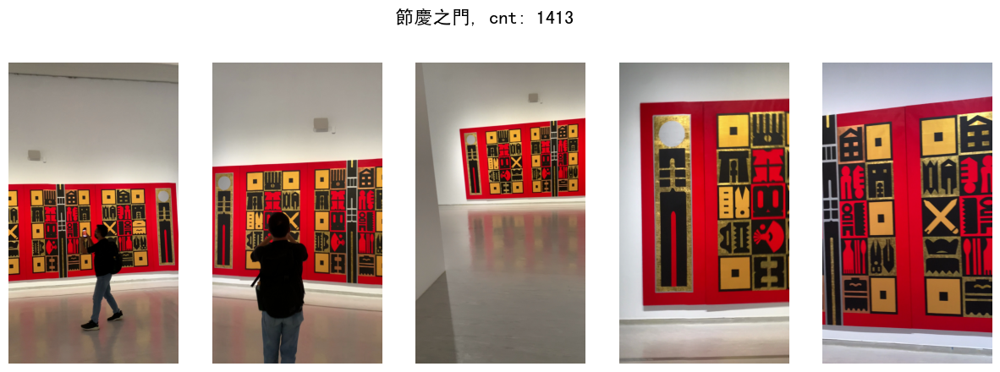

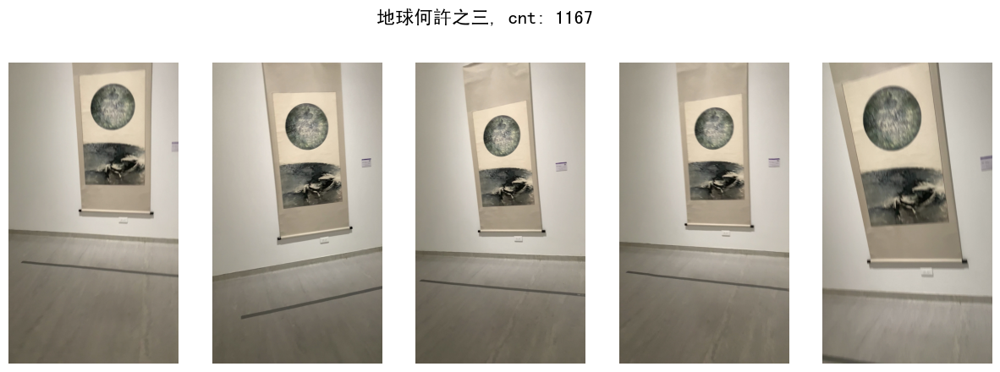

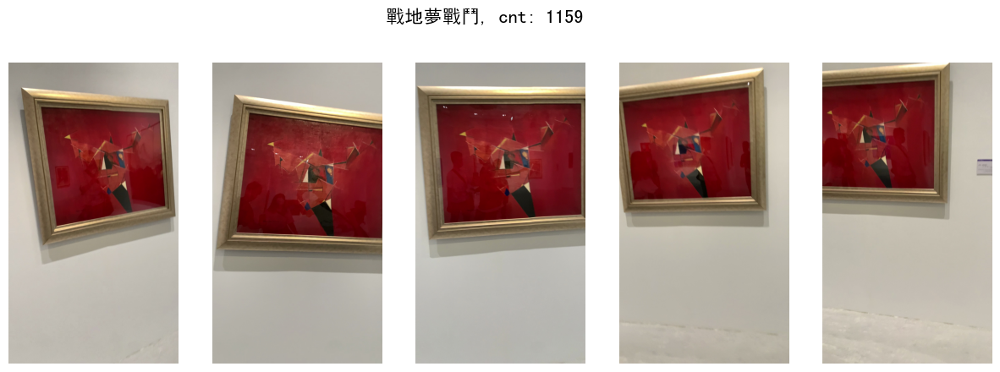

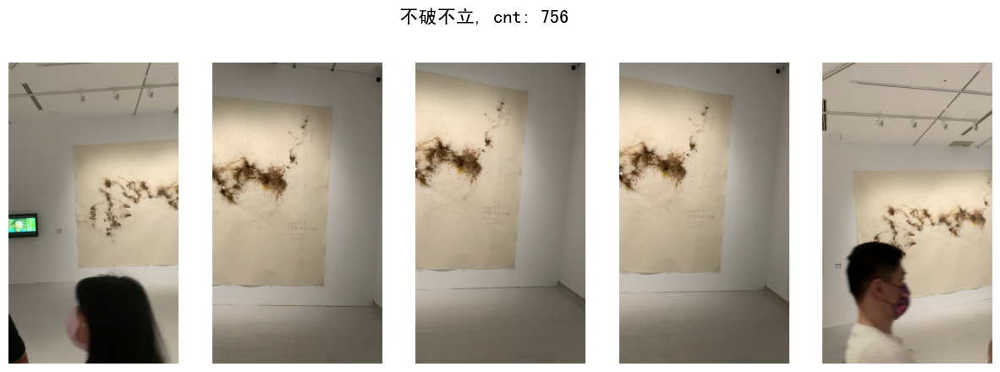

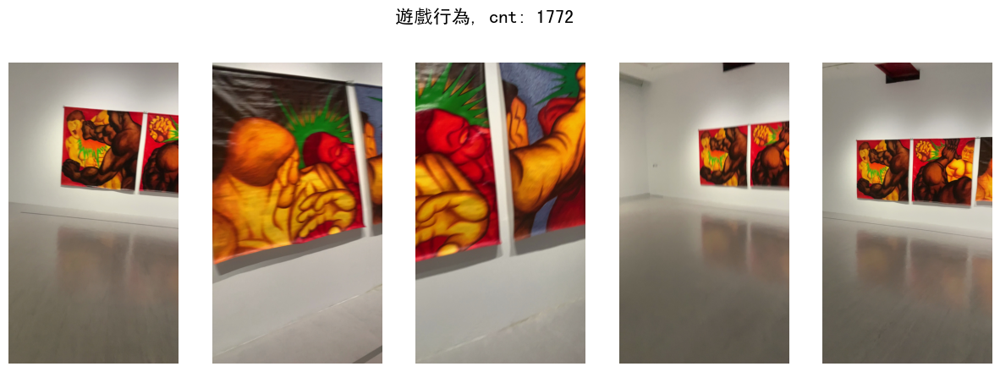

In [2]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import platform

system = platform.system()

if system == 'Windows':
    # Use Microsoft YaHei font for Chinese text on Windows
    font_name = 'Microsoft YaHei'
else:
    # Use SimHei font for Chinese text on other systems (e.g. macOS, Linux)
    font_name = 'SimHei'

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = [font_name]
plt.rcParams['axes.unicode_minus'] = False

# Set the directories
data_dir = './data'

# Set the number of images to sample per class
num_samples = 5

# Loop over each class directory in the data directory
for class_dirname in os.listdir(data_dir):
    if class_dirname in ["train", "val", "test"]:
        continue
    class_dir = os.path.join(data_dir, class_dirname)

    # Get a list of all the image files in the class directory
    image_files = [f for f in os.listdir(class_dir) if f.endswith('.jpg')]

    # Sample some images from the list
    sample_files = random.sample(image_files, num_samples)

    # Create a new figure for the class
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))

    # Loop over each sample file and plot it
    for i, sample_file in enumerate(sample_files):
        sample_path = os.path.join(class_dir, sample_file)

        # Load the image and resize it
        image = Image.open(sample_path)

        # Plot the image and the class name
        axs[i].imshow(image)
        axs[i].axis('off')

    # Set the title of the figure to the class name
    fig.suptitle(f"{class_dirname}, cnt: {len(image_files)}", fontsize=16)

    # Display the figure
    plt.show()
